## Gather

In [136]:
import json as js
import pandas as pd
import numpy as np
import requests
import matplotlib.pyplot as plt
import pandas_profiling as pp
%matplotlib inline

In [137]:
#loading twitter archiv
twitter_archive = pd.read_csv('twitter-archive-enhanced.csv')
twitter_archive.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


In [138]:
#loading image prediction
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
respon = requests.get(url)
with open('image_predictions.tsv', mode='wb') as file:
    file.write(respon.content)

image_predictions = pd.read_csv('image_predictions.tsv', sep='\t')


In [139]:
image_predictions.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


In [140]:
#loading tweets json into list and get only tweet id, retweet count, favorite count 

tweet_json = []
with open('tweet-json.txt') as file:
    for line in file:
        lin = js.loads(line)
        tweet_json.append({'tweet_id':lin['id'],
                           'retweet_count':lin['retweet_count'],
                           'favorite_count':lin['favorite_count']})

In [141]:
#convert tweet list to dataframe
tweet_json = pd.DataFrame(tweet_json, columns = ['tweet_id', 'retweet_count', 'favorite_count'])
tweet_json.head()

,tweet_id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048


## Assess

>Visual assessment

In [142]:
twitter_archive

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666049248...,5,10,None,None,None,None,None
2352,666044226329800704,NaN,NaN,2015-11-16 00:04:52 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a purebred Piers Morgan. Loves to Netf...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666044226...,6,10,a,None,None,None,None
2353,666033412701032449,NaN,NaN,2015-11-15 23:21:54 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here is a very happy pup. Big fan of well-main...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666033412...,9,10,a,None,None,None,None
2354,666029285002620928,NaN,NaN,2015-11-15 23:05:30 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a western brown Mitsubishi terrier. Up...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666029285...,7,10,a,None,None,None,None


In [143]:
image_predictions

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
...,...,...,...,...,...,...,...,...,...,...,...,...
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True


In [144]:
tweet_json

,tweet_id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048
...,...,...,...
2349,666049248165822465,41,111
2350,666044226329800704,147,311
2351,666033412701032449,47,128
2352,666029285002620928,48,132


>programmatic assessment

In [145]:
twitter_archive.describe()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,rating_numerator,rating_denominator
count,2.356000e+03,7.800000e+01,7.800000e+01,1.810000e+02,1.810000e+02,2356.000000,2356.000000
mean,7.427716e+17,7.455079e+17,2.014171e+16,7.720400e+17,1.241698e+16,13.126486,10.455433
std,6.856705e+16,7.582492e+16,1.252797e+17,6.236928e+16,9.599254e+16,45.876648,6.745237
min,6.660209e+17,6.658147e+17,1.185634e+07,6.661041e+17,7.832140e+05,0.000000,0.000000
25%,6.783989e+17,6.757419e+17,3.086374e+08,7.186315e+17,4.196984e+09,10.000000,10.000000
50%,7.196279e+17,7.038708e+17,4.196984e+09,7.804657e+17,4.196984e+09,11.000000,10.000000
75%,7.993373e+17,8.257804e+17,4.196984e+09,8.203146e+17,4.196984e+09,12.000000,10.000000
max,8.924206e+17,8.862664e+17,8.405479e+17,8.874740e+17,7.874618e+17,1776.000000,170.000000


In [146]:
twitter_archive.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
tweet_id                      2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null object
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
rating_denominator            2356 non-null int64
name                          2356 non-null object
doggo                         2356 non-null object
floofer                       2356 non-null object
pupper                        2356 non-null object
puppo                         2356 non-null object
dtypes: float64(4), int64(3), ob

In [147]:
# i used the pandas profiling library
pp.ProfileReport(twitter_archive)

In [148]:
image_predictions.describe()

,tweet_id,img_num,p1_conf,p2_conf,p3_conf
count,2.075000e+03,2075.000000,2075.000000,2.075000e+03,2.075000e+03
mean,7.384514e+17,1.203855,0.594548,1.345886e-01,6.032417e-02
std,6.785203e+16,0.561875,0.271174,1.006657e-01,5.090593e-02
min,6.660209e+17,1.000000,0.044333,1.011300e-08,1.740170e-10
25%,6.764835e+17,1.000000,0.364412,5.388625e-02,1.622240e-02
50%,7.119988e+17,1.000000,0.588230,1.181810e-01,4.944380e-02
75%,7.932034e+17,1.000000,0.843855,1.955655e-01,9.180755e-02
max,8.924206e+17,4.000000,1.000000,4.880140e-01,2.734190e-01


In [149]:
image_predictions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
tweet_id    2075 non-null int64
jpg_url     2075 non-null object
img_num     2075 non-null int64
p1          2075 non-null object
p1_conf     2075 non-null float64
p1_dog      2075 non-null bool
p2          2075 non-null object
p2_conf     2075 non-null float64
p2_dog      2075 non-null bool
p3          2075 non-null object
p3_conf     2075 non-null float64
p3_dog      2075 non-null bool
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [150]:
# i used the pandas profiling library
pp.ProfileReport(image_predictions)

In [151]:
tweet_json.describe()

,tweet_id,retweet_count,favorite_count
count,2.354000e+03,2354.000000,2354.000000
mean,7.426978e+17,3164.797366,8080.968564
std,6.852812e+16,5284.770364,11814.771334
min,6.660209e+17,0.000000,0.000000
25%,6.783975e+17,624.500000,1415.000000
50%,7.194596e+17,1473.500000,3603.500000
75%,7.993058e+17,3652.000000,10122.250000
max,8.924206e+17,79515.000000,132810.000000


In [152]:
tweet_json.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 3 columns):
tweet_id          2354 non-null int64
retweet_count     2354 non-null int64
favorite_count    2354 non-null int64
dtypes: int64(3)
memory usage: 55.3 KB


In [153]:
# i used the pandas profiling library
pp.ProfileReport(tweet_json)

## Assessment report
> ## Quality issues 
- #### twitter_archive 
    - some columns not needed
    - timestamp wrong type
    - some names in the name variable are not accurate
    - some value in rating_denominator should be 10s
    - some values in rating_numerator should not be more then 10
    - from the source variable need to extract the source
    - tweet_id is numaric make it str
    - remove non tweets wich has valus in the retweet columns
    - expanded_urls has some missing values which mean they do not have pictures
- #### image_predictions 
    - change column names to something descreptive
    - tweet_id is numaric make it str
- #### tweet_json
    - tweet_id is numaric make it str


> ## Tidiness issues
- the columns (doggo, floofer, pupper and puppo) in twitter_archive need to combined in one column
- creat master table to join all 3 tables on tweet_id
   


## Clean
> - ### Define
    - #### twitter_archive
        - remove non tweets wich has valus in the retweet columns by querying twitter_archive with out retweet rows
        - expanded_urls has some missing values which mean they do not have pictures, removes these rows
        - the columns (doggo, floofer, pupper and puppo) in twitter_archive need to combined in one column, joining
        - some value in rating_denominator should be 10s
        - some values in rating_numerator should not be more then 10
        - extracting the source from source variable
        - some names in the name variable are not accurate, will replace 'a' with None
        - timestamp wrong type
        - tweet_id is numaric make it str
        - drop the columns are not needed
    - #### image_predictions
        - change column names to something descreptive
        - tweet_id is numaric make it str
    - #### tweet_json
        - tweet_id is numaric make it str
    - #### creat master table
    



> - ## Code

In [154]:
#copy the twitter_archive with out the retweeted rows
twitter_clean = twitter_archive.query('retweeted_status_id == "NaN"')

In [155]:
#drop rows where expanded_urls is empty
twitter_clean = twitter_clean[twitter_clean.expanded_urls.notnull()]

In [156]:
#creat new column which combine the dog stages columns
twitter_clean['stage'] = twitter_clean[['doggo', 'floofer', 'pupper', 'puppo']].max(axis=1)

In [157]:
#fixing rating_numerator
twitter_clean.loc[(twitter_clean.rating_numerator > 10), 'rating_numerator'] = 10

In [158]:
#fixinf rating_denominator
twitter_clean.loc[(twitter_clean.rating_denominator != 10), 'rating_denominator'] = 10

In [159]:
#cleaning source variable
twitter_clean.loc[(twitter_clean.source == '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>'), 'source'] = 'Twitter for iPhone'
twitter_clean.loc[(twitter_clean.source == '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>'), 'source'] = 'Vine - Make a Scene'
twitter_clean.loc[(twitter_clean.source == '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>'), 'source'] = 'Twitter Web Client'
twitter_clean.loc[(twitter_clean.source == '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'), 'source'] = 'TweetDeck'

In [160]:
#fixinf name values
twitter_clean.loc[(twitter_clean.name == 'a'), 'name'] = 'None'

In [161]:
#changing timestamp to datetime and tweet_id to string
twitter_clean['timestamp'] = pd.to_datetime(twitter_clean['timestamp'])
twitter_clean['tweet_id'] = twitter_clean['tweet_id'].astype(str)

In [162]:
#drop the not needed columns
twitter_clean = twitter_clean.drop(['in_reply_to_status_id', 'in_reply_to_user_id', 'retweeted_status_id', 'retweeted_status_user_id', 'retweeted_status_timestamp','doggo', 'floofer', 'pupper', 'puppo'], axis=1)

In [163]:
#tweet_json table changing tweet_id type
tweet_json['tweet_id'] = tweet_json['tweet_id'].astype(str)

In [164]:
#image_predictions table changing tweet_id type
image_predictions['tweet_id'] = image_predictions['tweet_id'].astype(str)

In [165]:
#image_predictions table changing column names to be usefull
image_predictions = image_predictions.rename(columns={'p1':'prediction1', 'p1_conf':'pre1_confidence', 'p1_dog':'pre1_is_dog',
                                                      'p2':'prediction2', 'p2_conf':'pre2_confidence', 'p2_dog':'pre2_is_dog',
                                                      'p3':'prediction3', 'p3_conf':'pre3_confidence', 'p3_dog':'pre3_is_dog'})

## Testing the cleaing code

In [166]:
pp.ProfileReport(twitter_clean)

In [167]:
pp.ProfileReport(tweet_json)

In [168]:
pp.ProfileReport(image_predictions)

In [169]:
#ijoining all 3 tables based on tweet_id

twitter_archive_master = pd.merge(twitter_clean, tweet_json, on='tweet_id', how='inner' )
twitter_archive_master = pd.merge(twitter_archive_master, image_predictions, on='tweet_id', how='inner' )

In [170]:
#assessing the master table
pp.ProfileReport(twitter_archive_master)

## Analytics
> 
  - max retweets
  - max favorits
  - top scources and plot

In [173]:
twitter_archive_master.retweet_count.max()

79515

In [174]:
twitter_archive_master.favorite_count.max()

132810

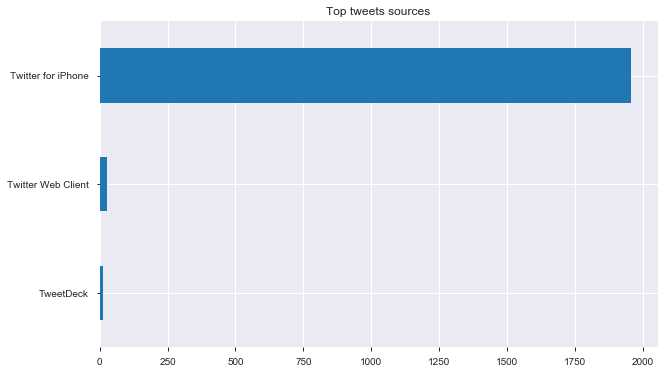

In [189]:
twitter_archive_master.source.value_counts().sort_values(ascending=True).plot(kind='barh', figsize=(10,6), title='Top tweets sources');

## Exporting master table

In [190]:
twitter_archive_master.to_csv('twitter_archive_master.csv')